In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
# For reading stock data from yahoo
from pandas_datareader.data import DataReader
# For time stamps
from datetime import datetime
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
from prophet import Prophet
from sklearn.preprocessing import MinMaxScaler


In [2]:
!pip install pandas_datareader

In [3]:
!pip install yfinance

In [11]:
# import yfinance as yf
# import pandas as pd
# from datetime import datetime

# # Define the list of ticker symbols and their corresponding company names
# tickers = {'AAPL': 'Apple', 'AMZN': 'Amazon', 'GOOGL': 'Google', 'MSFT': 'Microsoft'}

# # Define the time range
# start_date = '2017-01-01'
# end_date = '2024-10-01'

# # Create an empty DataFrame to store all data
# combined_data = pd.DataFrame()

# # Download the data for each ticker and add company name
# for ticker, company_name in tickers.items():
#     print(f"Downloading data for {ticker} ({company_name})")
#     df = yf.download(ticker, start=start_date, end=end_date)

#     # Add the company_name column
#     df['company_name'] = company_name

#     # Reset index to make the 'Date' column part of the DataFrame
#     df = df.reset_index()

#     # Append to the combined_data DataFrame
#     combined_data = pd.concat([combined_data, df])

# # Save the raw data to a CSV file
# combined_data.to_csv('combined_stock_data_raw.csv', index=False)

# print("Raw data saved to 'combined_stock_data_raw.csv'")


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed

[*********************100%***********************]  1 of 1 completed


In [51]:
# Load the saved raw CSV data
df = pd.read_csv("/content/combined_stock_data_raw.csv")

df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,company_name
0,2017-01-03,28.950001,29.082500,28.690001,29.037500,26.921551,115127600,Apple
1,2017-01-04,28.962500,29.127501,28.937500,29.004999,26.891417,84472400,Apple
2,2017-01-05,28.980000,29.215000,28.952499,29.152500,27.028170,88774400,Apple
3,2017-01-06,29.195000,29.540001,29.117500,29.477501,27.329485,127007600,Apple
4,2017-01-09,29.487499,29.857500,29.485001,29.747499,27.579811,134247600,Apple


In [52]:
df['Date']= pd.to_datetime(df.Date, format='%Y-%m-%d')
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,company_name
0,2017-01-03,28.950001,29.082500,28.690001,29.037500,26.921551,115127600,Apple
1,2017-01-04,28.962500,29.127501,28.937500,29.004999,26.891417,84472400,Apple
2,2017-01-05,28.980000,29.215000,28.952499,29.152500,27.028170,88774400,Apple
3,2017-01-06,29.195000,29.540001,29.117500,29.477501,27.329485,127007600,Apple
4,2017-01-09,29.487499,29.857500,29.485001,29.747499,27.579811,134247600,Apple


In [53]:
import pandas as pd

df['Date'] = pd.to_datetime(df['Date'])  #

# Extract Year, Month, Day, and Time from the Date column
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['Time'] = df['Date'].dt.time

df = df[['Date', 'Year', 'Month', 'Day', 'Time',
         'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'company_name']]

# Display the first few rows to verify
df.head()


,Date,Year,Month,Day,Time,Open,High,Low,Close,Adj Close,Volume,company_name
0,2017-01-03,2017,1,3,00:00:00,28.950001,29.082500,28.690001,29.037500,26.921551,115127600,Apple
1,2017-01-04,2017,1,4,00:00:00,28.962500,29.127501,28.937500,29.004999,26.891417,84472400,Apple
2,2017-01-05,2017,1,5,00:00:00,28.980000,29.215000,28.952499,29.152500,27.028170,88774400,Apple
3,2017-01-06,2017,1,6,00:00:00,29.195000,29.540001,29.117500,29.477501,27.329485,127007600,Apple
4,2017-01-09,2017,1,9,00:00:00,29.487499,29.857500,29.485001,29.747499,27.579811,134247600,Apple


The Time column shows 00:00:00 because stock market data from Yahoo Finance typically represents daily data, and the timestamp is set to midnight (00:00:00) for all records. This is because each row corresponds to an entire trading day, and there is no intraday data (hourly or minute-level information) in the dataset you're downloading.

In [54]:
df.shape

(7792, 12)

In [55]:
df.columns

Index(['Date', 'Year', 'Month', 'Day', 'Time', 'Open', 'High', 'Low', 'Close',
       'Adj Close', 'Volume', 'company_name'],
      dtype='object')

In [56]:
# Step 1: Check for missing values
print("Missing values before cleaning:")
print(df.isnull().sum())


Missing values before cleaning:
Date            0
Year            0
Month           0
Day             0
Time            0
Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
company_name    0
dtype: int64


In [57]:
# Drop unnecessary columns
df = df.drop(columns=['Time'])
df.head()

,Date,Year,Month,Day,Open,High,Low,Close,Adj Close,Volume,company_name
0,2017-01-03,2017,1,3,28.950001,29.082500,28.690001,29.037500,26.921551,115127600,Apple
1,2017-01-04,2017,1,4,28.962500,29.127501,28.937500,29.004999,26.891417,84472400,Apple
2,2017-01-05,2017,1,5,28.980000,29.215000,28.952499,29.152500,27.028170,88774400,Apple
3,2017-01-06,2017,1,6,29.195000,29.540001,29.117500,29.477501,27.329485,127007600,Apple
4,2017-01-09,2017,1,9,29.487499,29.857500,29.485001,29.747499,27.579811,134247600,Apple


In [58]:
data = df.copy()

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7792 entries, 0 to 7791
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          7792 non-null   datetime64[ns]
 1   Year          7792 non-null   int32         
 2   Month         7792 non-null   int32         
 3   Day           7792 non-null   int32         
 4   Open          7792 non-null   float64       
 5   High          7792 non-null   float64       
 6   Low           7792 non-null   float64       
 7   Close         7792 non-null   float64       
 8   Adj Close     7792 non-null   float64       
 9   Volume        7792 non-null   int64         
 10  company_name  7792 non-null   object        
dtypes: datetime64[ns](1), float64(5), int32(3), int64(1), object(1)
memory usage: 578.4+ KB


## Descriptive statistics

In [59]:
# Descriptive statistics for the numerical columns
descriptive_stats = df.describe()
descriptive_stats


,Date,Year,Month,Day,Open,High,Low,Close,Adj Close,Volume
count,7792,7792.000000,7792.000000,7792.000000,7792.000000,7792.000000,7792.000000,7792.000000,7792.000000,7.792000e+03
mean,2020-11-15 00:29:34.127310080,2020.384497,6.394764,15.741786,133.275516,134.674607,131.845003,133.312508,131.438005,6.037112e+07
min,2017-01-03 00:00:00,2017.000000,1.000000,1.000000,28.950001,29.082500,28.690001,29.004999,26.891417,7.425600e+06
25%,2018-12-09 06:00:00,2018.000000,3.000000,8.000000,68.867502,69.618998,68.047503,68.937502,66.628965,2.726578e+07
50%,2020-11-12 12:00:00,2020.000000,6.000000,16.000000,117.114998,118.730000,115.721249,117.305000,115.884998,4.628900e+07
75%,2022-10-20 06:00:00,2022.000000,9.000000,23.000000,167.097500,168.640873,165.159996,166.822502,165.959476,7.875268e+07
max,2024-09-30 00:00:00,2024.000000,12.000000,31.000000,467.000000,468.350006,464.459991,467.559998,466.718781,4.479400e+08
std,NaN,2.236328,3.382244,8.757288,83.831733,84.577797,83.010298,83.830573,83.168273,4.650072e+07


## Exploratory Data Analysis (EDA)

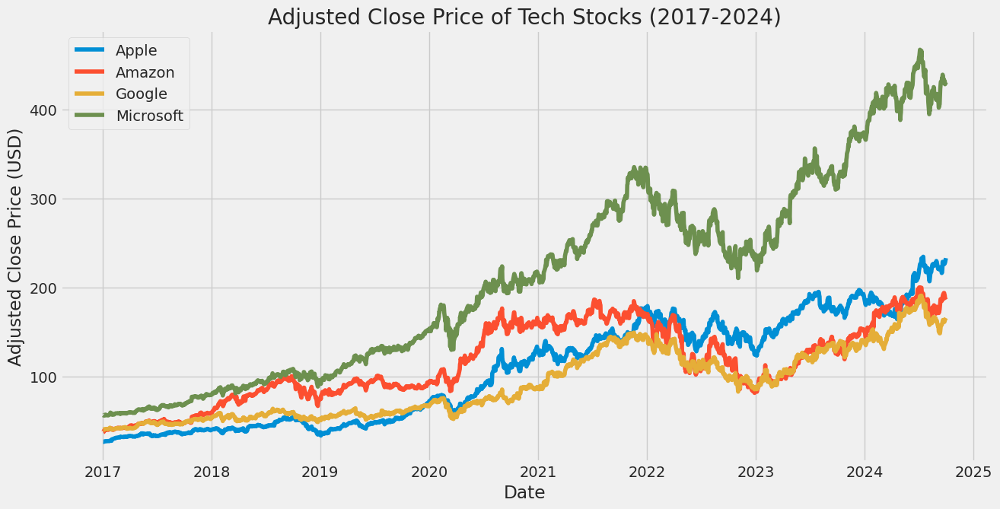

In [60]:
plt.figure(figsize=(14,7))
for company in df['company_name'].unique():
    company_data = df[df['company_name'] == company]
    plt.plot(company_data['Date'], company_data['Adj Close'], label=company)

plt.title('Adjusted Close Price of Tech Stocks (2017-2024)')
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price (USD)')
plt.legend()
plt.grid(True)
plt.show()


#### Daily Stock Price Changes (Daily Returns)

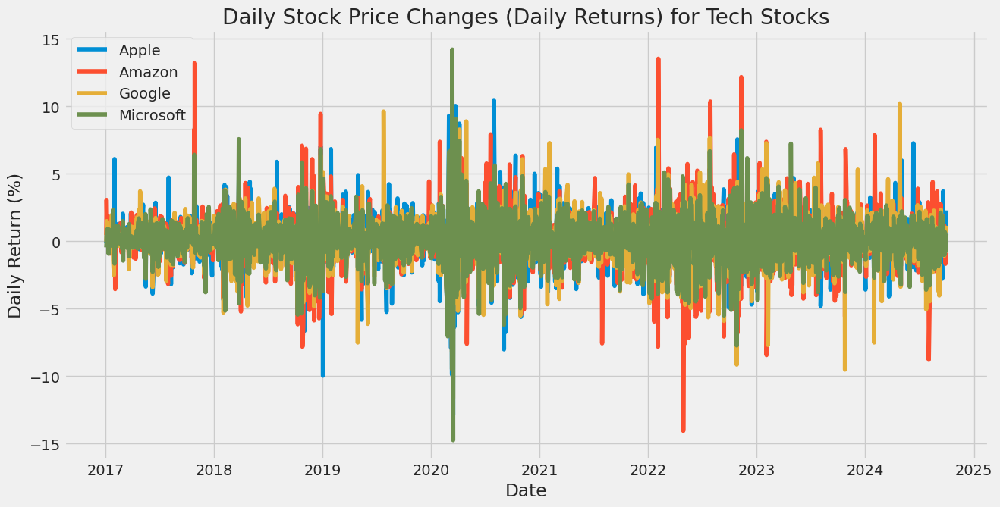

In [61]:
# Calculate daily returns (percentage change)
df['Daily Return'] = df.groupby('company_name')['Adj Close'].pct_change() * 100

# Plot the daily returns for each company
plt.figure(figsize=(14,7))
for company in df['company_name'].unique():
    company_data = df[df['company_name'] == company]
    plt.plot(company_data['Date'], company_data['Daily Return'], label=company)

plt.title('Daily Stock Price Changes (Daily Returns) for Tech Stocks')
plt.xlabel('Date')
plt.ylabel('Daily Return (%)')
plt.legend()
plt.grid(True)
plt.show()


#### 50-Day and 200-Day Moving Averages (Trend)

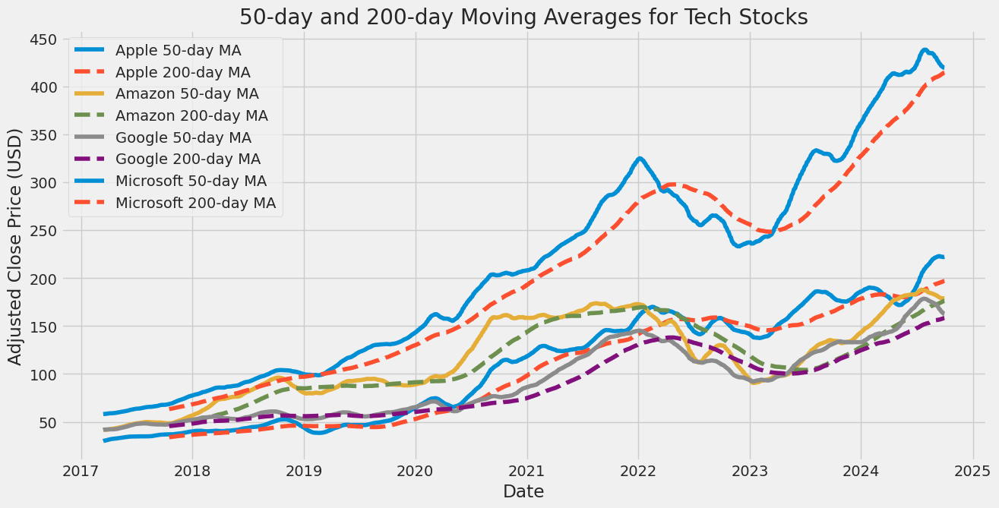

In [62]:
# Calculate the 50-day and 200-day moving averages
df['50-day MA'] = df.groupby('company_name')['Adj Close'].rolling(window=50).mean().reset_index(0, drop=True)
df['200-day MA'] = df.groupby('company_name')['Adj Close'].rolling(window=200).mean().reset_index(0, drop=True)

plt.figure(figsize=(14,7))
for company in df['company_name'].unique():
    company_data = df[df['company_name'] == company]
    plt.plot(company_data['Date'], company_data['50-day MA'], label=f'{company} 50-day MA')
    plt.plot(company_data['Date'], company_data['200-day MA'], label=f'{company} 200-day MA', linestyle='--')

plt.title('50-day and 200-day Moving Averages for Tech Stocks')
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price (USD)')
plt.legend()
plt.grid(True)
plt.show()


### Stock Price Volatility (Rolling Standard Deviation)

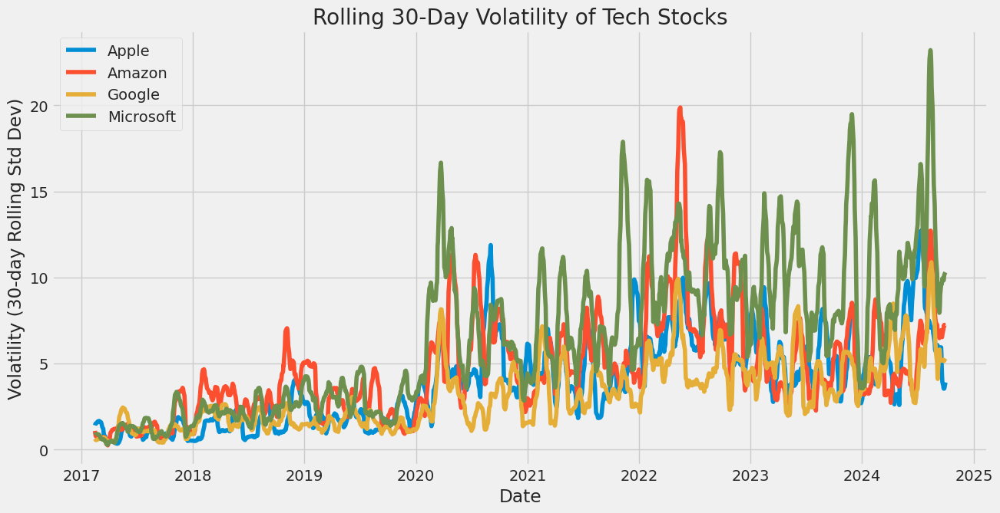

In [63]:
# Calculate rolling standard deviation (volatility) with a window of 30 days
df['Volatility'] = df.groupby('company_name')['Adj Close'].rolling(window=30).std().reset_index(0, drop=True)

plt.figure(figsize=(14,7))
for company in df['company_name'].unique():
    company_data = df[df['company_name'] == company]
    plt.plot(company_data['Date'], company_data['Volatility'], label=company)

plt.title('Rolling 30-Day Volatility of Tech Stocks')
plt.xlabel('Date')
plt.ylabel('Volatility (30-day Rolling Std Dev)')
plt.legend()
plt.grid(True)
plt.show()


 #### Daily Stock Prices (Adjusted Close) for Each Company

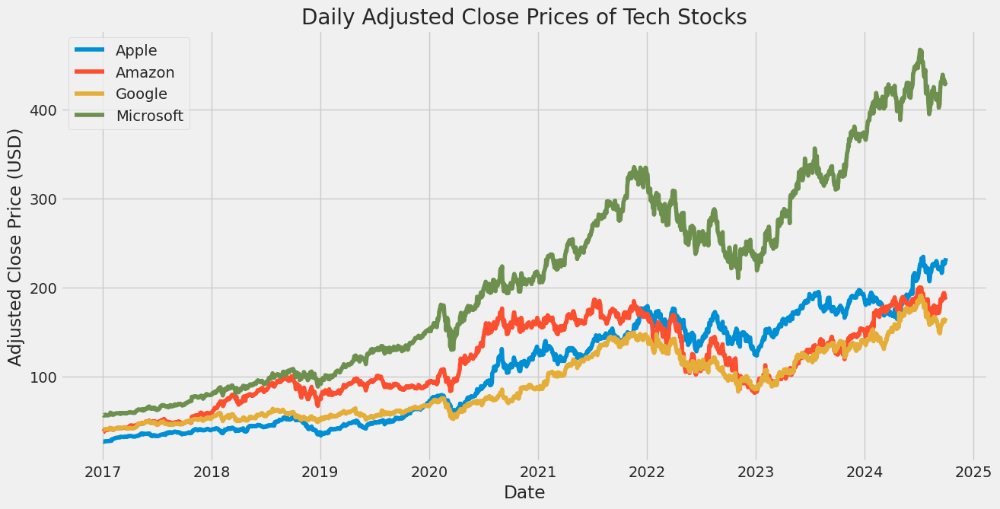

In [64]:
plt.figure(figsize=(14,7))
for company in df['company_name'].unique():
    company_data = df[df['company_name'] == company]
    plt.plot(company_data['Date'], company_data['Adj Close'], label=company)

plt.title('Daily Adjusted Close Prices of Tech Stocks')
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price (USD)')
plt.legend()
plt.grid(True)
plt.show()


### Correlation Heatmap for Tech Stocks

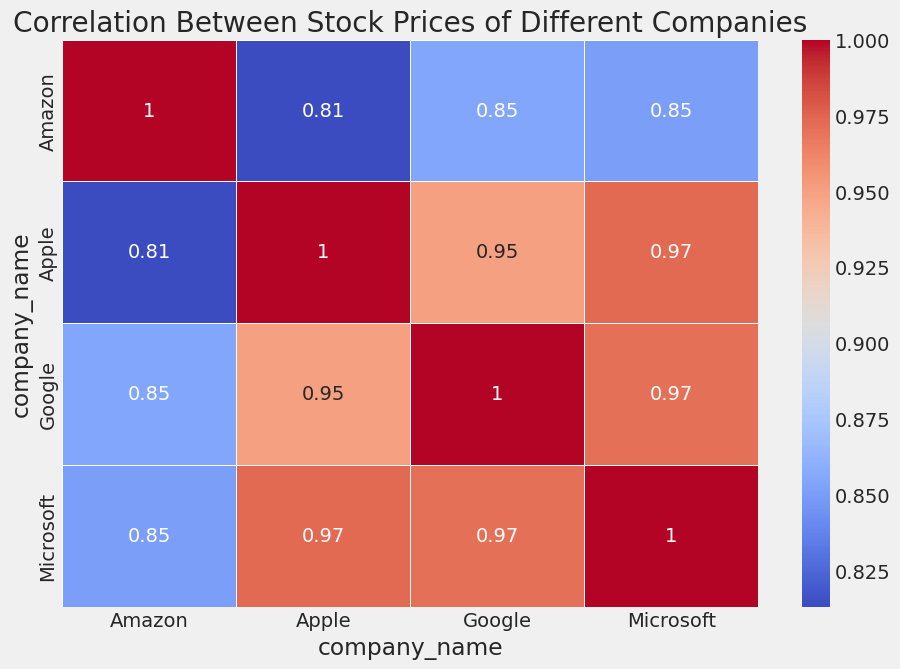

In [65]:
# Pivot the data to have stock prices as columns
pivot_df = df.pivot_table(values='Adj Close', columns='company_name', index='Date')

# Calculate the correlation between stock prices
correlation_matrix = pivot_df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Between Stock Prices of Different Companies')
plt.show()


### Boxplot of Stock Prices Distribution for Each Company

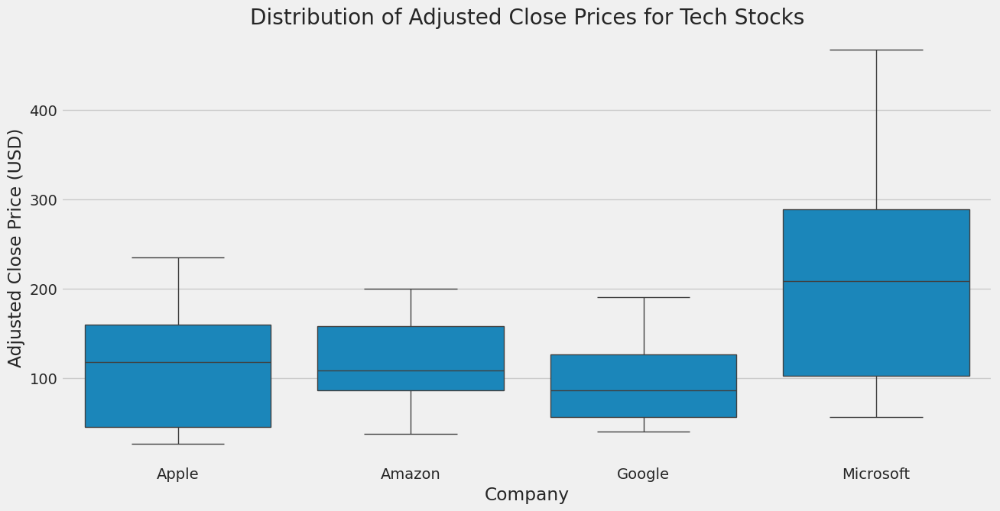

In [66]:
plt.figure(figsize=(14,7))
sns.boxplot(x='company_name', y='Adj Close', data=df)
plt.title('Distribution of Adjusted Close Prices for Tech Stocks')
plt.xlabel('Company')
plt.ylabel('Adjusted Close Price (USD)')
plt.show()


### Annual Returns (Yearly Stock Returns)

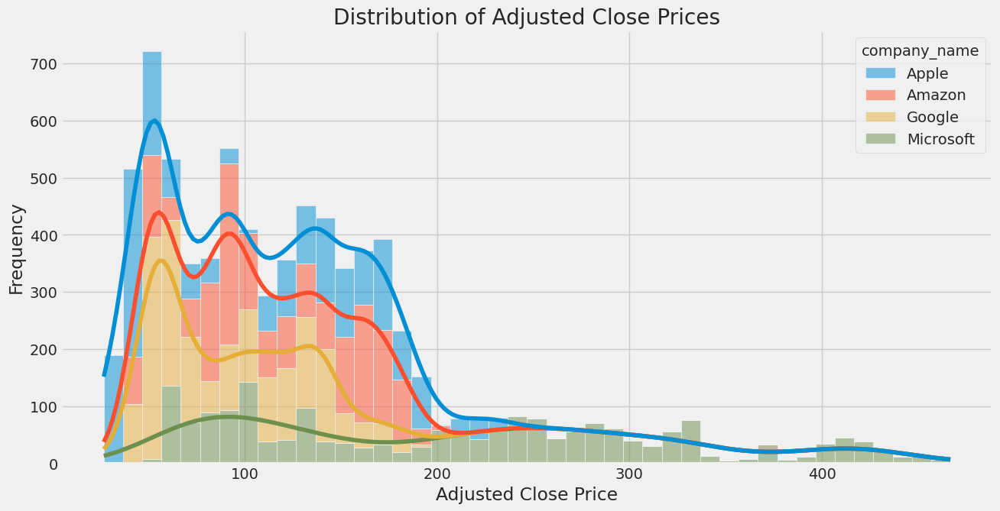

In [67]:
# Histogram for 'Adj Close' prices
plt.figure(figsize=(14, 7))
sns.histplot(data=df, x='Adj Close', hue='company_name', kde=True, multiple="stack")
plt.title('Distribution of Adjusted Close Prices')
plt.xlabel('Adjusted Close Price')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


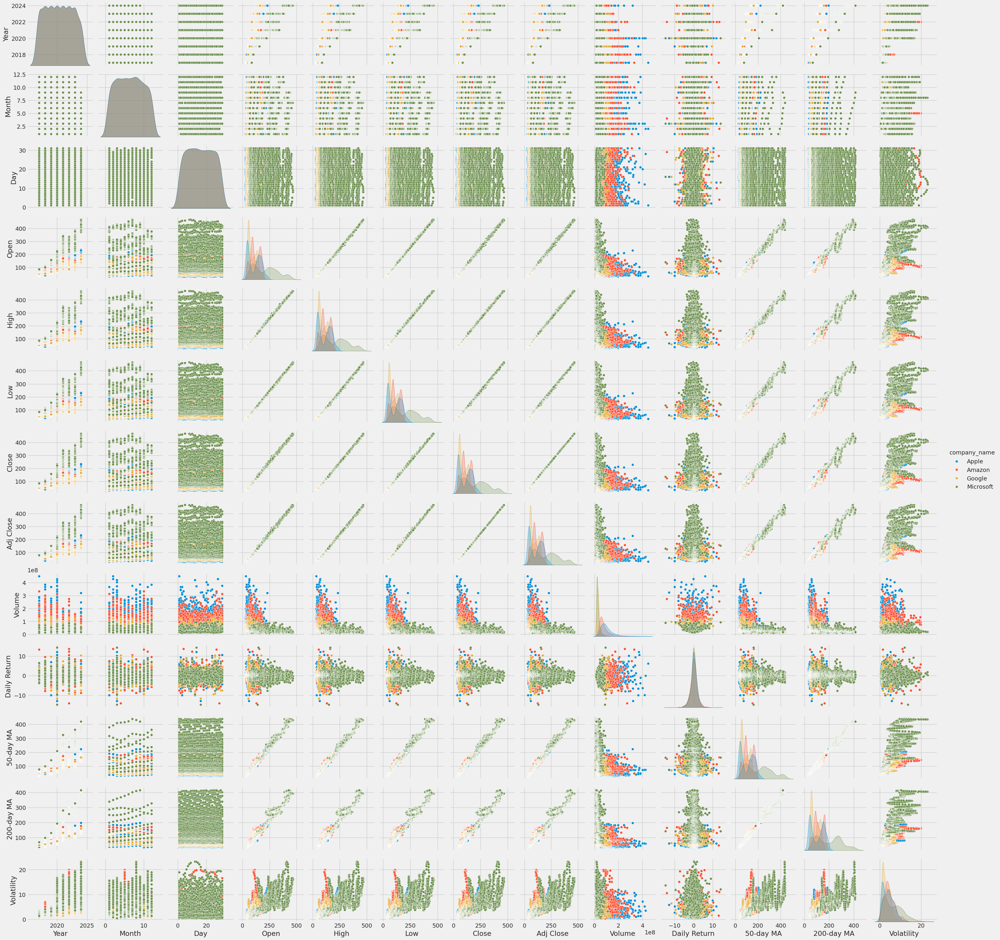

In [49]:
# Pair plot for multi-variable analysis
sns.pairplot(df, hue='company_name')
plt.show()



In [68]:
# df = pd.read_csv("/content/combined_stock_data_raw.csv")
data.head()

,Date,Year,Month,Day,Open,High,Low,Close,Adj Close,Volume,company_name
0,2017-01-03,2017,1,3,28.950001,29.082500,28.690001,29.037500,26.921551,115127600,Apple
1,2017-01-04,2017,1,4,28.962500,29.127501,28.937500,29.004999,26.891417,84472400,Apple
2,2017-01-05,2017,1,5,28.980000,29.215000,28.952499,29.152500,27.028170,88774400,Apple
3,2017-01-06,2017,1,6,29.195000,29.540001,29.117500,29.477501,27.329485,127007600,Apple
4,2017-01-09,2017,1,9,29.487499,29.857500,29.485001,29.747499,27.579811,134247600,Apple


### Apply Scaling - MinMaxScaler

In [69]:
from sklearn.preprocessing import MinMaxScaler

# Normalize data for each company
def normalize_data(data, feature_col='Close'):
    scalers = {}
    normalized_data = {}

    for company in data['company_name'].unique():
        company_data = data[data['company_name'] == company].copy()
        scaler = MinMaxScaler(feature_range=(0, 1))
        company_data[feature_col] = scaler.fit_transform(company_data[[feature_col]])
        scalers[company] = scaler
        normalized_data[company] = company_data

    return normalized_data, scalers

# Apply normalization
normalized_data, scalers = normalize_data(df)


**LSTM**

In [70]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Generate LSTM-compatible sequences
def generate_lstm_sequences(data, feature_col='Close', seq_length=60):
    sequences = {}
    for company, company_data in data.items():
        values = company_data[feature_col].values
        seq_data, labels = [], []
        for i in range(seq_length, len(values)):
            seq_data.append(values[i - seq_length:i])
            labels.append(values[i])
        sequences[company] = (np.array(seq_data), np.array(labels))
    return sequences

# Build LSTM model
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=input_shape),
        Dropout(0.2),
        LSTM(50, return_sequences=False),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Prepare sequences
sequences = generate_lstm_sequences(normalized_data)


**Train & Evaluate LSTM Metrics**

In [71]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Train and evaluate LSTM
def train_and_evaluate_lstm(sequences):
    results = {}
    for company, (seq_data, labels) in sequences.items():
        # Split into training and testing
        split_index = int(len(seq_data) * 0.8)
        train_seq, test_seq = seq_data[:split_index], seq_data[split_index:]
        train_labels, test_labels = labels[:split_index], labels[split_index:]

        # Reshape data for LSTM
        train_seq = train_seq.reshape((train_seq.shape[0], train_seq.shape[1], 1))
        test_seq = test_seq.reshape((test_seq.shape[0], test_seq.shape[1], 1))

        # Build and train the model
        input_shape = (train_seq.shape[1], 1)
        model = build_lstm_model(input_shape)
        model.fit(train_seq, train_labels, epochs=10, batch_size=32, verbose=1)

        # Evaluate on test data
        predictions = model.predict(test_seq)
        mse = mean_squared_error(test_labels, predictions)
        rmse = mse**0.5
        mae = mean_absolute_error(test_labels, predictions)

        # Store results
        results[company] = {'MSE': mse, 'RMSE': rmse, 'MAE': mae}
    return results

# Evaluate LSTM results
lstm_results = train_and_evaluate_lstm(sequences)
print("LSTM Results:", lstm_results)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0439
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0022
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0021
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0018
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0016
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0741
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0038
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0038
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0042
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0040
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0029
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0030
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0032
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0031
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0028
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0373
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0018
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0020
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0017
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0014
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0014
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0013
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0012
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0015
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0256
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0011
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
LSTM Results: {'Apple': {'MSE': 0.0026215650141881864, 'RMSE': 0.05120122082712664, 'MAE': 0.04294343330069764}, 'Amazon': {'MSE': 0.001626231573843325, 'RMSE': 0.040326561641718536, 'MAE': 0.033225144357934916}, 'Google': {'MSE': 0.0022136297321552734, 'RMSE': 0.04704922669030038, 'MAE': 0.038973407816613514}, 'Micro

**Define and Train the ARIMA Model**

In [72]:
from statsmodels.tsa.arima.model import ARIMA

# Train ARIMA
def train_arima(data, p=1, d=1, q=1):
    models = {}
    for company, company_data in data.items():
        train_data = company_data['Close'].values
        model = ARIMA(train_data, order=(p, d, q))
        model_fit = model.fit()
        models[company] = model_fit
    return models

# Train ARIMA models
arima_models = train_arima(normalized_data)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


**Evaluate ARIMA Model**

In [73]:
# Evaluate ARIMA
def evaluate_arima(models, data):
    results = {}
    for company, model in models.items():
        train_data = data[company]['Close'].values
        predictions = model.forecast(steps=10)
        actual = train_data[-10:]
        mse = mean_squared_error(actual, predictions)
        rmse = mse**0.5
        mae = mean_absolute_error(actual, predictions)
        results[company] = {'MSE': mse, 'RMSE': rmse, 'MAE': mae}
    return results

# Evaluate ARIMA results
arima_results = evaluate_arima(arima_models, normalized_data)
print("ARIMA Results:", arima_results)


ARIMA Results: {'Apple': {'MSE': 0.001486941518902673, 'RMSE': 0.03856088068110832, 'MAE': 0.03251947837362733}, 'Amazon': {'MSE': 0.0008307636775769407, 'RMSE': 0.02882297135232488, 'MAE': 0.02289208791888895}, 'Google': {'MSE': 0.0006236738226793343, 'RMSE': 0.024973462368669153, 'MAE': 0.022104099161630864}, 'Microsoft': {'MSE': 8.789377929440756e-05, 'RMSE': 0.00937516822752571, 'MAE': 0.007099577811399272}}


**Define and Train the Prophet Model**

In [74]:
from prophet import Prophet

# Train Prophet
def train_prophet(data):
    models = {}
    for company, company_data in data.items():
        df = company_data[['Date', 'Close']].rename(columns={'Date': 'ds', 'Close': 'y'})
        model = Prophet()
        model.fit(df)
        models[company] = model
    return models

# Train Prophet models
prophet_models = train_prophet(normalized_data)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpwlfqx3da/qe_yvxlp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpwlfqx3da/0_4l7wbb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68734', 'data', 'file=/tmp/tmpwlfqx3da/qe_yvxlp.json', 'init=/tmp/tmpwlfqx3da/0_4l7wbb.json', 'output', 'file=/tmp/tmpwlfqx3da/prophet_modelcspzd24a/prophet_model-20241208045729.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:57:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:57:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpwl

**Evaluate Prophet Model**

In [75]:
# Evaluate Prophet
def evaluate_prophet(models, data):
    results = {}
    for company, model in models.items():
        df = data[company][['Date', 'Close']].rename(columns={'Date': 'ds', 'Close': 'y'})
        future = model.make_future_dataframe(periods=10)
        forecast = model.predict(future)
        actual = df['y'][-10:].values
        predicted = forecast['yhat'][-10:].values
        mse = mean_squared_error(actual, predicted)
        rmse = mse**0.5
        mae = mean_absolute_error(actual, predicted)
        results[company] = {'MSE': mse, 'RMSE': rmse, 'MAE': mae}
    return results

# Evaluate Prophet results
prophet_results = evaluate_prophet(prophet_models, normalized_data)
print("Prophet Results:", prophet_results)


Prophet Results: {'Apple': {'MSE': 0.004219294818610544, 'RMSE': 0.06495609916405498, 'MAE': 0.06121229800207902}, 'Amazon': {'MSE': 0.0020630266389226972, 'RMSE': 0.045420553045099496, 'MAE': 0.04128471092574028}, 'Google': {'MSE': 0.009268114671412638, 'RMSE': 0.096271047939724, 'MAE': 0.09590605954563913}, 'Microsoft': {'MSE': 0.0025408809184387887, 'RMSE': 0.050407151461263795, 'MAE': 0.0493601207192958}}


**All Model Results**

In [76]:
# Consolidate and print results
def print_all_results(lstm_results, arima_results, prophet_results):
    print("\nModel Results:")
    for company in lstm_results.keys():
        print(f"\nResults for {company}:")
        print(f"LSTM - MSE: {lstm_results[company]['MSE']:.5f}, RMSE: {lstm_results[company]['RMSE']:.5f}, MAE: {lstm_results[company]['MAE']:.5f}")
        print(f"ARIMA - MSE: {arima_results[company]['MSE']:.5f}, RMSE: {arima_results[company]['RMSE']:.5f}, MAE: {arima_results[company]['MAE']:.5f}")
        print(f"Prophet - MSE: {prophet_results[company]['MSE']:.5f}, RMSE: {prophet_results[company]['RMSE']:.5f}, MAE: {prophet_results[company]['MAE']:.5f}")

# Print results
print_all_results(lstm_results, arima_results, prophet_results)



Model Results:

Results for Apple:
LSTM - MSE: 0.00262, RMSE: 0.05120, MAE: 0.04294
ARIMA - MSE: 0.00149, RMSE: 0.03856, MAE: 0.03252
Prophet - MSE: 0.00422, RMSE: 0.06496, MAE: 0.06121

Results for Amazon:
LSTM - MSE: 0.00163, RMSE: 0.04033, MAE: 0.03323
ARIMA - MSE: 0.00083, RMSE: 0.02882, MAE: 0.02289
Prophet - MSE: 0.00206, RMSE: 0.04542, MAE: 0.04128

Results for Google:
LSTM - MSE: 0.00221, RMSE: 0.04705, MAE: 0.03897
ARIMA - MSE: 0.00062, RMSE: 0.02497, MAE: 0.02210
Prophet - MSE: 0.00927, RMSE: 0.09627, MAE: 0.09591

Results for Microsoft:
LSTM - MSE: 0.00279, RMSE: 0.05284, MAE: 0.04646
ARIMA - MSE: 0.00009, RMSE: 0.00938, MAE: 0.00710
Prophet - MSE: 0.00254, RMSE: 0.05041, MAE: 0.04936


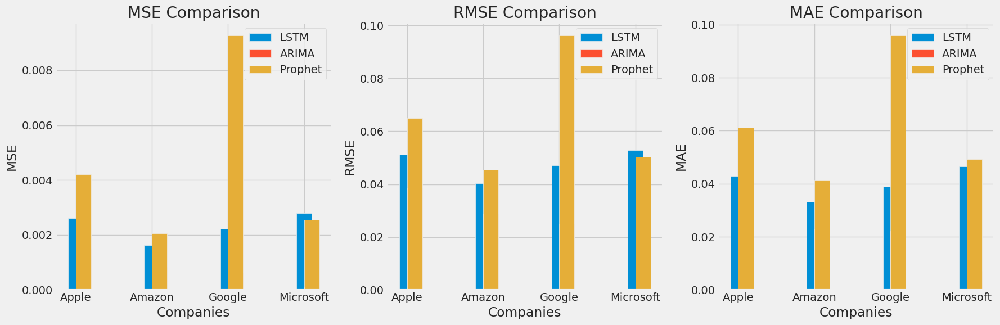

In [77]:
import matplotlib.pyplot as plt
import numpy as np

# Consolidate the results into a format suitable for plotting
companies = ['Apple', 'Amazon', 'Google', 'Microsoft']

lstm_mse = [lstm_results[company]['MSE'] for company in companies]
arima_mse = [arima_results[company]['MSE'] for company in companies]
prophet_mse = [prophet_results[company]['MSE'] for company in companies]

lstm_rmse = [lstm_results[company]['RMSE'] for company in companies]
arima_rmse = [arima_results[company]['RMSE'] for company in companies]
prophet_rmse = [prophet_results[company]['RMSE'] for company in companies]

lstm_mae = [lstm_results[company]['MAE'] for company in companies]
arima_mae = [arima_results[company]['MAE'] for company in companies]
prophet_mae = [prophet_results[company]['MAE'] for company in companies]

# Create a bar chart for MSE, RMSE, and MAE for each company
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# MSE Plot
axes[0].bar(companies, lstm_mse, width=0.2, label='LSTM', align='center')
axes[0].bar(companies, arima_mse, width=0.2, label='ARIMA', align='edge')
axes[0].bar(companies, prophet_mse, width=0.2, label='Prophet', align='edge')
axes[0].set_title('MSE Comparison')
axes[0].set_xlabel('Companies')
axes[0].set_ylabel('MSE')
axes[0].legend()

# RMSE Plot
axes[1].bar(companies, lstm_rmse, width=0.2, label='LSTM', align='center')
axes[1].bar(companies, arima_rmse, width=0.2, label='ARIMA', align='edge')
axes[1].bar(companies, prophet_rmse, width=0.2, label='Prophet', align='edge')
axes[1].set_title('RMSE Comparison')
axes[1].set_xlabel('Companies')
axes[1].set_ylabel('RMSE')
axes[1].legend()

# MAE Plot
axes[2].bar(companies, lstm_mae, width=0.2, label='LSTM', align='center')
axes[2].bar(companies, arima_mae, width=0.2, label='ARIMA', align='edge')
axes[2].bar(companies, prophet_mae, width=0.2, label='Prophet', align='edge')
axes[2].set_title('MAE Comparison')
axes[2].set_xlabel('Companies')
axes[2].set_ylabel('MAE')
axes[2].legend()

# Display the plots
plt.tight_layout()
plt.show()


# **Applying Hyperparameters for LSTM**

**Generate LSTM Sequences**

In [78]:
import numpy as np

# Generate LSTM-compatible sequences
def generate_lstm_sequences(data, feature_col='Close', seq_length=60):
    sequences = {}
    for company, company_data in data.items():
        values = company_data[feature_col].values
        seq_data, labels = [], []
        for i in range(seq_length, len(values)):
            seq_data.append(values[i - seq_length:i])
            labels.append(values[i])
        sequences[company] = (np.array(seq_data), np.array(labels))
    return sequences


**Build LSTM Model with Hyperparameters**

In [79]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Build LSTM model with hyperparameters for optimization
def build_lstm_model(input_shape, lstm_units=50, dropout_rate=0.2):
    model = Sequential([
        LSTM(lstm_units, return_sequences=True, input_shape=input_shape),
        Dropout(dropout_rate),
        LSTM(lstm_units, return_sequences=False),
        Dropout(dropout_rate),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model


**Train and Evaluate LSTM with Hyperparameters**

In [80]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Train and evaluate LSTM model with hyperparameters
def train_and_evaluate_lstm(sequences, lstm_units=50, dropout_rate=0.2, epochs=10, batch_size=32):
    results = {}
    for company, (seq_data, labels) in sequences.items():
        # Split into training and testing
        split_index = int(len(seq_data) * 0.8)
        train_seq, test_seq = seq_data[:split_index], seq_data[split_index:]
        train_labels, test_labels = labels[:split_index], labels[split_index:]

        # Reshape data for LSTM
        train_seq = train_seq.reshape((train_seq.shape[0], train_seq.shape[1], 1))
        test_seq = test_seq.reshape((test_seq.shape[0], test_seq.shape[1], 1))

        # Build and train the model
        input_shape = (train_seq.shape[1], 1)
        model = build_lstm_model(input_shape, lstm_units, dropout_rate)
        model.fit(train_seq, train_labels, epochs=epochs, batch_size=batch_size, verbose=1)

        # Evaluate on test data
        predictions = model.predict(test_seq)
        mse = mean_squared_error(test_labels, predictions)
        rmse = mse**0.5
        mae = mean_absolute_error(test_labels, predictions)

        # Store results
        results[company] = {'MSE': mse, 'RMSE': rmse, 'MAE': mae}
    return results


**Hyperparameter Search (Manually tuning key parameters)**

In [81]:
# Hyperparameters to tune
lstm_units_options = [50, 100, 150]
dropout_rate_options = [0.2, 0.3, 0.4]
epochs_options = [10, 20]
batch_size_options = [32, 64]

# Store the best results
best_results = {}
best_hyperparameters = {}

# Grid search for best hyperparameters
for lstm_units in lstm_units_options:
    for dropout_rate in dropout_rate_options:
        for epochs in epochs_options:
            for batch_size in batch_size_options:
                print(f"Training with LSTM units: {lstm_units}, Dropout rate: {dropout_rate}, Epochs: {epochs}, Batch size: {batch_size}")

                # Train and evaluate the model
                lstm_results = train_and_evaluate_lstm(sequences, lstm_units=lstm_units, dropout_rate=dropout_rate, epochs=epochs, batch_size=batch_size)

                # Store the results
                for company, metrics in lstm_results.items():
                    mse = metrics['MSE']
                    if company not in best_results:
                        best_results[company] = {'MSE': mse, 'RMSE': metrics['RMSE'], 'MAE': metrics['MAE']}
                        best_hyperparameters[company] = (lstm_units, dropout_rate, epochs, batch_size)
                    else:
                        if mse < best_results[company]['MSE']:  # If current model has better MSE
                            best_results[company] = {'MSE': mse, 'RMSE': metrics['RMSE'], 'MAE': metrics['MAE']}
                            best_hyperparameters[company] = (lstm_units, dropout_rate, epochs, batch_size)

# Print the best hyperparameters and results
print("\nBest Results and Hyperparameters:")
for company in best_results:
    print(f"\nResults for {company}:")
    print(f"Best Hyperparameters: LSTM units: {best_hyperparameters[company][0]}, Dropout rate: {best_hyperparameters[company][1]}, Epochs: {best_hyperparameters[company][2]}, Batch size: {best_hyperparameters[company][3]}")
    print(f"LSTM - MSE: {best_results[company]['MSE']:.5f}, RMSE: {best_results[company]['RMSE']:.5f}, MAE: {best_results[company]['MAE']:.5f}")


Training with LSTM units: 50, Dropout rate: 0.2, Epochs: 10, Batch size: 32
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0371
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0020
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0582
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0042
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0034
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0034
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0035
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0033
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0028
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0026
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0029
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0027
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0300
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0312
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0018
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0015
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0013
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0013
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0011
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Training with LSTM units: 50, Dropout rate: 0.2, Epochs: 10, Batch size: 64
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0497
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0034
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0021
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.1141
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0076
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0046
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0037
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0036
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0037
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0038
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0033
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0032
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0035
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0366
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0030
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0451
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0014
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0013
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0012
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0011
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Training with LSTM units: 50, Dropout rate: 0.2, Epochs: 20, Batch size: 32
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0287
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0014
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 16/20
48/48 ━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0624
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0043
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0043
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0040
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0036
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0026
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0023
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0026
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0025
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 16/20
48/48 ━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0346
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0018
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0020
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0013
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0013
Epoch 16/20
48/48 ━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0419
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0020
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.9912e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.4996e-04
Epoch 16/20
48/48 ━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0352
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0020
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 16/20
24/24 ━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0757
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0056
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0046
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0040
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0036
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0031
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0038
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0029
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0033
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0034
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0033
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0029 
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0029
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0029
Epoch 16/20
24/24 ━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0527
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0029
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 16/20
24/24 ━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0352
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0026
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010    
Epoch 16/20
24/24 ━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0534
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0031
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0027
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0029
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0027
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0024
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0022
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0024
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0020
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0399
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0060
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0055
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0047
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0041
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0041
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0040
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0040
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0036
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0033
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0452
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0027
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0019
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0016
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0016
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0016
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0344
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0028
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0020
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0019
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0018
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0018
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
Training with LSTM units: 50, Dropout rate: 0.3, Epochs: 10, Batch size: 64
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0621
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0049
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.1515
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0111
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0062
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0059
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0052
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0048
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0051
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0047
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0048
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0042
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0442
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0038
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0376
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0031
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Training with LSTM units: 50, Dropout rate: 0.3, Epochs: 20, Batch size: 32
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0429
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0032
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0031
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0024
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0025
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0023
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0026
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0019
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0021
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 16/20
48/48 ━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0618
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0052
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0054
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0047
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0044
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0041
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0038
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0045
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0041
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0033
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0033
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0034
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0034
Epoch 16/20
48/48 ━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0362 
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0034
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0025
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0020
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0025
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0017
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0017
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0018
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 16/20
48/48 ━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0238
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0023
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0019
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0017
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0020
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0018
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0016
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0016
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012
Epoch 16/20
48/48 ━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0359
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0041
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0021
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0022
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0020
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0020
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0015
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0019
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0017
Epoch 16/20
24/24 ━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.1174
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0096
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0063
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0060
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0052
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0046
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0045
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0049
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0040
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0043
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0038
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0043
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0043
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0043
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0041
Epoch 16/20
24/24 ━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0284
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0033
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0025
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0024
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 16/20
24/24 ━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0411
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0037
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0028
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0016
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0018
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0017
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0018
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0016
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 16/20
24/24 ━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0303
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0036
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0034
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0029
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0021
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0510
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0079
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0069
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0066
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0066
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0061
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0055
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0049
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0047
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0049
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0504
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0033
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0027
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0026
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0026
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0025
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0386
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0034
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0029
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0029
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0026
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0026
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0020
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Training with LSTM units: 50, Dropout rate: 0.4, Epochs: 10, Batch size: 64
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0585
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0058
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0039
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0044
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0032
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0033
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0026
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0026
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.1156
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0140
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0085
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0073
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0080
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0060
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0065
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0061
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0058
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0059
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0283
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0040
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0029
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0630
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0065
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0035
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0036
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0034
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Training with LSTM units: 50, Dropout rate: 0.4, Epochs: 20, Batch size: 32
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0327
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0043
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0048
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0036
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0037
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0031
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0023
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0025
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0025
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0022
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0018
Epoch 16/20
48/48 ━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0608
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0083
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0061
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0057
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0059
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0060
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0056
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0045
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0048
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0044
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0041
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0046
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0041
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0047
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0044
Epoch 16/20
48/48 ━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0356
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0037
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0029
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0024
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0019
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0020
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0016
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0019
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0023
Epoch 16/20
48/48 ━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0344
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0037
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0026
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0027
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0023
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0020
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0019
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0017
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0019
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0017
Epoch 16/20
48/48 ━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0526
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0059
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0046
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0034
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0037
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0029
Epoch 16/20
24/24 ━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.1228
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0122
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0080
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0067
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0074
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0059
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0061
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0058
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0055
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0055
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0051 
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0055
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0050
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0056
Epoch 16/20
24/24 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0261
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0042
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0040
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0020
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0021
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0021
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0022
Epoch 16/20
24/24 ━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0415
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0049
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0034
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0028
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020
Epoch 16/20
24/24 ━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0262
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0014
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0012
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0010
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0011
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.0236e-04
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.1967e-04
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0420
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0026
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0020
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0018
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0242
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010    
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.0032e-04
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.8789e-04
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.4409e-04
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.5147e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0240
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.8742e-04
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 8.3230e-04
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 7.8355e-04
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 9.1163e-04
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 8.0313e-04
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7.2148e-04
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.5729e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Training with LSTM units: 100, Dropout rate: 0.2, Epochs: 10, Batch size: 64
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0418
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0021
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0872
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0046
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0021
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0021
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0022
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0020
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0317
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0014
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.7060e-04
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0478
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.3642e-04
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 8.6346e-04
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 8.1309e-04
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 9.2353e-04
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 8.9780e-04
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 7.6358e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Training with LSTM units: 100, Dropout rate: 0.2, Epochs: 20, Batch size: 32
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0301
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010    
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.5697e-04
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.6440e-04
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.8385e-04
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.9182e-04
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.3292e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.1304e-04
E

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0409
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0027
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0021
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0018
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 16/20
48/48 ━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0230
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.9318e-04
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.1059e-04
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.7661e-04
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.3540e-04
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.1534e-04
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.0926e-04
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.3465e-04
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.0917e-04
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.5717e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0386
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.2589e-04
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.8956e-04
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.1928e-04
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.9304e-04
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.8931e-04
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.7853e-04
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.4841e-04
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.1211e-04
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.2137e-04
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.4992e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - lo

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0402
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0017 
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.1837e-04
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.7291e-04
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.5796e-04
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.9292e-04
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.7833e-04
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.6564e-04
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.3762e-04
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.1820e

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0921
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0057
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0027
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0025
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0026
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0023
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0023
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0022
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0021
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0019
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0024
Epoch 16/20
24/24 ━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0321
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0016
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.2910e-04
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.7920e-04
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.2800e-04
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.9399e-04
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.3668e-04
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.9019e-04
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.4306e-04
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.8315e-04
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 8.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0223
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0015
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.1867e-04
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.9375e-04
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.6488e-04
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.6517e-04
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.5127e-04
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.3018e-04
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.2251e-04
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.6857e-04
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.8945e-04
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.5083e-04
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.7929e-04
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0274
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0018
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0019
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0015
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0595
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0037
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0035
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0026
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0030
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0026
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0235
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0283
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0013
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0012
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Training with LSTM units: 100, Dropout rate: 0.3, Epochs: 10, Batch size: 64
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0454
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0029
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014 
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0702
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0050
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0039
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0031
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0031
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0032
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0028
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0334
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0022
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0012
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0290
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0020
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0014
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0013
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0013
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0010
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0014
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010    
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.9879e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Training with LSTM units: 100, Dropout rate: 0.3, Epochs: 20, Batch size: 32
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0297
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0015
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0014
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0010
Epoch 16/20
48/48 ━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0372
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0036
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0033
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0029
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0034
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0029
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0026
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0028
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0026
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0023
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0022
Epoch 16/20
48/48 ━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0155
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0014
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0014
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0014
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 9.7239e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.3292e-04
Epoch 16/20
48/48

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0280
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0013
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 9.7507e-04
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 9.6905e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 8.6121e-04
Epoch 16/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0364
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0024
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0018
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 16/20
24/24 ━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0705
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0046
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0032
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0028
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0033
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0029 
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025
Epoch 16/20
24/24 ━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0342
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0012
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0012
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0012
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0014
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0011
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0012
Epoch 16/20
24/24 ━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0492
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0023
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.2920e-04
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.1018e-04
Epoch 16/20
24/24 ━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0359
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0020
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0024
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0021
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0514
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0046
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0042
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0043
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0034
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0048
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0032
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0032
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0030
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0031
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0252
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0019
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0018
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0246
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0025
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0021
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0016
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Training with LSTM units: 100, Dropout rate: 0.4, Epochs: 10, Batch size: 64
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0238
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0030
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0018
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0775
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0055
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0043
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0041
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0036
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0043
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0038
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0038
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0036
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0032
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0322
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0427
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0025
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0019
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0018
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0015
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0016
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0015
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0014
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Training with LSTM units: 100, Dropout rate: 0.4, Epochs: 20, Batch size: 32
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0281
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0024
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0024
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0021
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0017
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0017
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0015
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0014
Epoch 16/20
48/48 ━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0357
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0040
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0038
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0044
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0039
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0041
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0037
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0035
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0033
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0034
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0026
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0033
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0027
Epoch 16/20
48/48 ━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0232
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0022
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0019
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0016
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0019
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0015
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0020
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0013
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 16/20
48/48 ━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0291
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0018
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0017
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0014
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0014
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0015
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0015
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 16/20
48/48 ━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0493
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0019
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0018
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0015
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0016
Epoch 16/20
24/24 ━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.1083
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0082
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0044
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0037
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0040
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0041
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0036
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0035
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0034
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0036
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0035
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0033
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0032
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0037
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0038
Epoch 16/20
24/24 ━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0303
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0026
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0019
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0019
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 16/20
24/24 ━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0349
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0013
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0013
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0013
Epoch 16/20
24/24 ━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0251
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0011
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.6945e-04
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.4557e-04
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.1060e-04
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.1643e-04
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.5156e-04
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.9802e-04
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.8697e-04
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.8230e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0375
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0022
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0020
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0023
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0018
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0016
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0160
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 8.9054e-04
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.2541e-04
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.9815e-04
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.8026e-04
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 9.7437e-04
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 7.2601e-04
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 8.2632e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0150
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.5031e-04
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.1603e-04
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 5.8634e-04
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 8.2196e-04
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 6.6828e-04
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.0554e-04
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.5850e-04
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.4130e-04
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.7510e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Training with LSTM units: 150, Dropout rate: 0.2, Epochs: 10, Batch size: 64
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0300
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0012
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.8869e-04
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 8.6211e-04
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 8.9481e-04
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 9.4444e-04
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 7.6839e-04
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 9.2437e-04
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.7770e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0732
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0029
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0022
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0019
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0019
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0366
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.4520e-04
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.2341e-04
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.6646e-04
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.4826e-04
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 8.2982e-04
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 7.7772e-04
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 8.6279e-04
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 7.6068e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0371
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0020
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.2422e-04
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.3863e-04
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.6070e-04
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.4213e-04
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.0997e-04
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.6756e-04
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.1149e-04
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.8960e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Training with LSTM units: 150, Dropout rate: 0.2, Epochs: 20, Batch size: 32
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0296
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.3150e-04
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.6759e-04
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7.0198e-04
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.5694e-04
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 9.2440e-04
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 8.9735e-04
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 8.0676e-04
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 9.4556e-04
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.1894e-04
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.0516e-04
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.7766e-04
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.5208e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0391
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0020
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0019
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0019
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0019
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0020
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0017
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0015
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 16/20
48/48 ━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0233
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.7607e-04
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.4449e-04
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 8.6766e-04
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 9.1063e-04
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 7.4467e-04
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 6.9253e-04
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 9.0626e-04
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 8.2450e-04
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.5361e-04
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7.3030e-04
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7.2584e-04
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.0206e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0156
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.3841e-04
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.9113e-04
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 6.5631e-04
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 6.7101e-04
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 6.6652e-04
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 8.4049e-04
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 5.9955e-04 
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.0871e-04
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 6.9746e-04
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 5.5504e-04
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 6.4312e-04
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 5.3104e-04
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 5.7448e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0375
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0017
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 9.0409e-04
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 8.9290e-04
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 9.3699e-04
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 8.7385e-04
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 9.2597e-04
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.0720e-04
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 9.1245e-04
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.8366e-04
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.5841e-04
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.6167e-04
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.8036e-04
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.8051e-04
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0586
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0028
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0023
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0019
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0016
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0014
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0014
Epoch 16/20
24/24 ━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0316
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0016
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.5584e-04
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 8.8330e-04
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 9.0510e-04
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.9322e-04
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 8.1975e-04
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.8061e-04
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.4938e-04
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.5517e-04
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.1977e-04
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.8898e-04
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.5315e-04
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.6160e-04
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0371
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0016
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.1951e-04
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.0667e-04
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 6.5061e-04
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.3498e-04
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.6910e-04
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.3179e-04
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 6.6976e-04
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.1299e-04
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.0059e-04
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 6.5449e-04
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 5.9768e-04
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.9212e-04
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0260
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0011
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0014
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0010
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0013
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.4535e-04
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.3567e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0484
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0039
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0026
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0022
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0025
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0022
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0020
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0134
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.6731e-04
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.0383e-04
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.6419e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0250
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.4485e-04
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.4055e-04
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.1771e-04
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 9.6705e-04
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 9.8300e-04
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 9.1227e-04
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0011
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.0589e-04
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7.7813e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Training with LSTM units: 150, Dropout rate: 0.3, Epochs: 10, Batch size: 64
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0351
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0024
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0012
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0012
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0010
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0010
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0010
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0788
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0058
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0029
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0024
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0023
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0023
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0021
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0024
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0265
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0025
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0011
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0012
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.2003e-04
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0284
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0016
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0010
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.6824e-04
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.0022e-04
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 8.1950e-04
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 7.5262e-04
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 7.0335e-04
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 9.2099e-04
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0010
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Training with LSTM units: 150, Dropout rate: 0.3, Epochs: 20, Batch size: 32
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0294
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.7407e-04
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.3665e-04
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.4786e-04
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.0158e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.7680e-04
Epoch 16/

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0523
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0024
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0025
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0025
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0019
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0020
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0023
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0020
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0018
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0017
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 16/20
48/48 ━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0187
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0013
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0010
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0013
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.3927e-04
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.7712e-04
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0011
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.9638e-04
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.8392e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.2737e-04
Epoch 16

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0168
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.5536e-04
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.6957e-04
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.0405e-04
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7.4606e-04
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.6192e-04
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 8.9033e-04
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.4754e-04
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 8.5863e-04
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.4098e-04
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7.6218e-04
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.6129e-04
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 6.6855e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0395
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0022
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0011
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010    
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0012
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.9946e-04
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.2254e-04
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 9.5345e-04
Epoch 16/

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0390
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0035
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0027
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0026
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021 
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0023
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0026
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0022
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0022
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0023
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0022
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0020
Epoch 16/20
24/24 ━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0391
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0022
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0011
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.3618e-04
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.9942e-04
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 9.7696e-04
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0011
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0011
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0010
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0010
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0011
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0010
Epoch 16

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0283
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0016
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0010
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.8847e-04
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 9.5816e-04
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.7195e-04
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.8676e-04
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.2768e-04
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 9.7230e-04
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.8528e-04
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.4913e-04
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 8.0782e-04
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 8.4833e-04
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0233
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0018
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0018
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0013
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0016
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0523
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0034
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0031
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0031
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0026
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0031
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0030
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0024
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0193
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0017
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0013
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0013
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0014
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0226
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0013
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0017
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 9.9262e-04
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 10/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Training with LSTM units: 150, Dropout rate: 0.4, Epochs: 10, Batch size: 64
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0376
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0026
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0018
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0017
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0013
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0676
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0062
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0041
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0033
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0035
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0028
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0027
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0027
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0352
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0024
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0014
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0013
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0011
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - loss: 0.0375
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0012
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0011
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0012
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.5910e-04
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Training with LSTM units: 150, Dropout rate: 0.4, Epochs: 20, Batch size: 32
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0257
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0023
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0017
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0019
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0016
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0018
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0013
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0017
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0013
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0014
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0014
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0013
Epoch 16/20
48/48 ━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0457
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0041
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0033
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0030
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0025
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0024
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0033
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0027
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0024
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023
Epoch 16/20
48/48 ━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0172
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0015
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0014
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0014
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0015
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0013
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0010
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.0686e-04
Epoch 16/20
48/48 ━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0192
Epoch 2/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0014
Epoch 3/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0012
Epoch 4/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0014
Epoch 5/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 6/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 7/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 8/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 9/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0011
Epoch 10/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 11/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 12/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 13/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 14/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.7493e-04
Epoch 15/20
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 16/20
48/48 ━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0379
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0022
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0017
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0014
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0014
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0016
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0013
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0014
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0013
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0014
Epoch 16/20
24/24 ━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0573
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0049
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0032
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0029
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0031
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0030
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0028
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0027
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0027
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0031
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0028
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0025
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0025
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021
Epoch 16/20
24/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0280
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0024
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0014
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0013
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0013
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0012
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0011
Epoch 16/20
24/24 ━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0294
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0017
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0013
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0012
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0013
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0013
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0013
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0012
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0010
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0011
Epoch 16/20
24/24 ━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


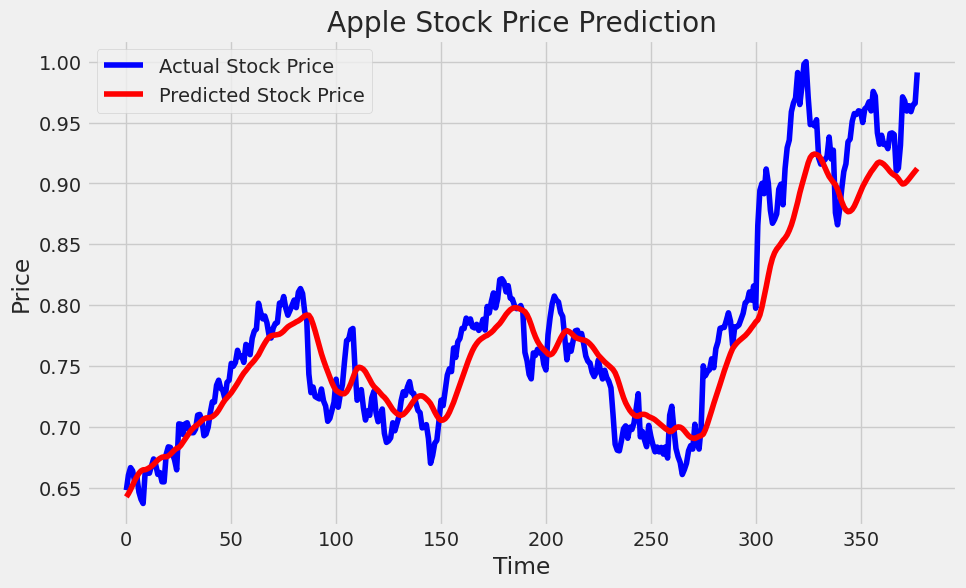

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


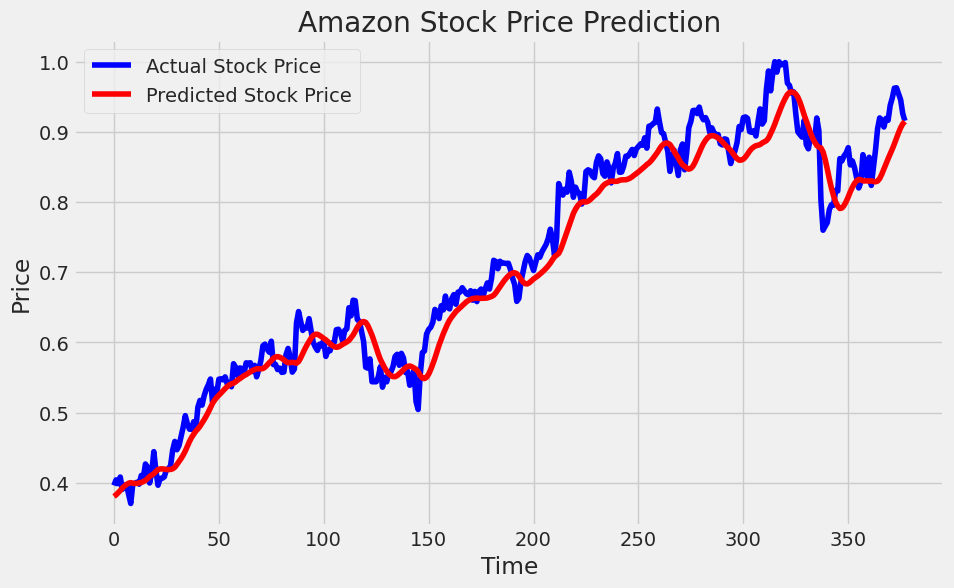

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


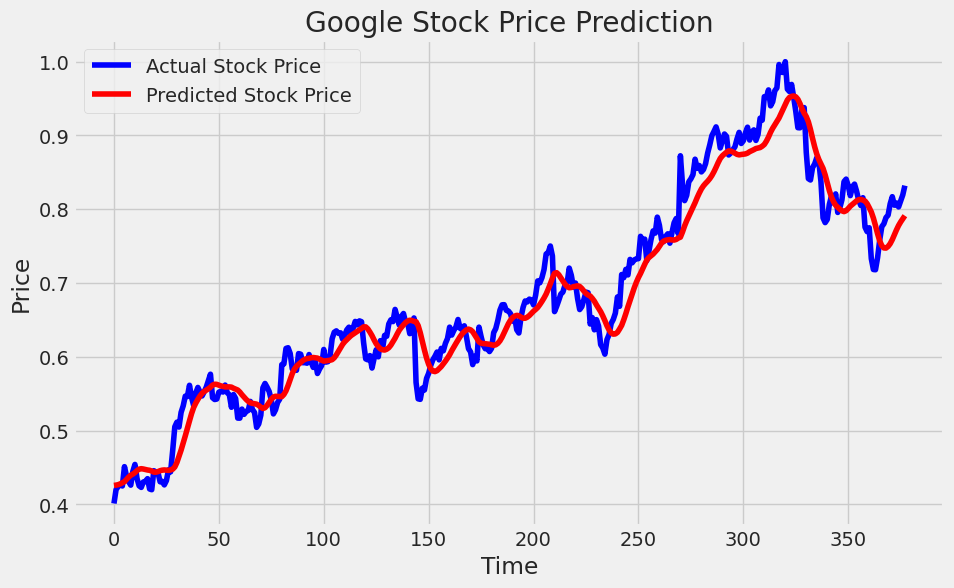

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


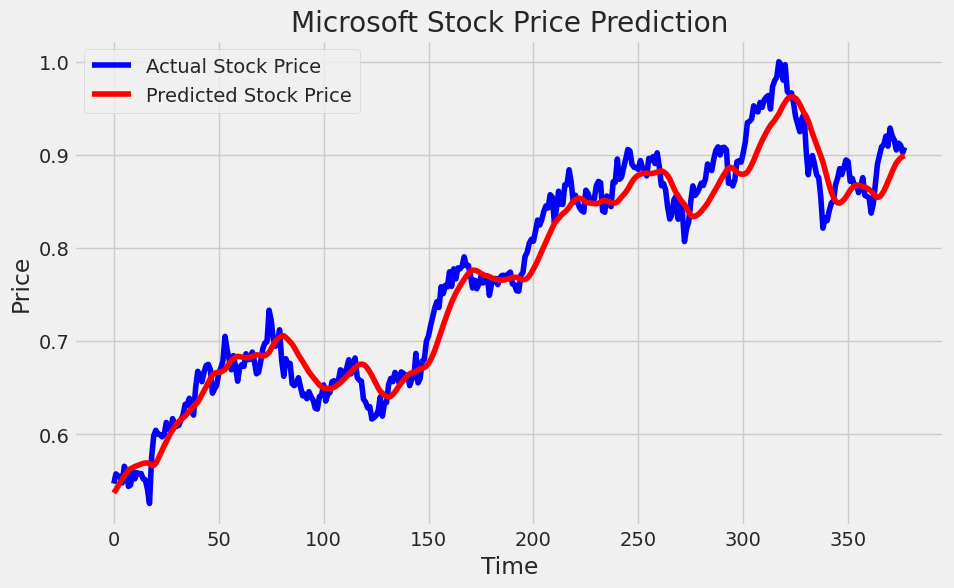

In [82]:
import matplotlib.pyplot as plt

# Visualize LSTM predictions
def plot_predictions(company, actual, predicted):
    plt.figure(figsize=(10,6))
    plt.plot(actual, color='blue', label='Actual Stock Price')
    plt.plot(predicted, color='red', label='Predicted Stock Price')
    plt.title(f'{company} Stock Price Prediction')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

# Visualizing predictions for each company
for company in best_results:
    # Get the test data and predictions
    test_seq = sequences[company][0][int(len(sequences[company][0]) * 0.8):]
    test_labels = sequences[company][1][int(len(sequences[company][0]) * 0.8):]
    model = build_lstm_model((test_seq.shape[1], 1), lstm_units=best_hyperparameters[company][0], dropout_rate=best_hyperparameters[company][1])
    model.fit(test_seq.reshape((test_seq.shape[0], test_seq.shape[1], 1)), test_labels, epochs=best_hyperparameters[company][2], batch_size=best_hyperparameters[company][3], verbose=0)

    predictions = model.predict(test_seq.reshape((test_seq.shape[0], test_seq.shape[1], 1)))
    plot_predictions(company, test_labels, predictions)


**Refined ARIMA Model with Hyperparameters Tuning**

In [83]:
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define the function to train ARIMA with hyperparameters (p, d, q)
def train_arima(data, p_values, d_values, q_values):
    best_models = {}
    best_params = {}
    best_scores = {}

    for company, company_data in data.items():
        train_data = company_data['Close'].values
        best_mse = float('inf')  # Initialize with a large number

        # Grid search for the best (p, d, q) combination
        for p in p_values:
            for d in d_values:
                for q in q_values:
                    try:
                        # Train the ARIMA model with the current (p, d, q) combination
                        model = ARIMA(train_data, order=(p, d, q))
                        model_fit = model.fit()

                        # Predict next 10 values (same as forecast step in evaluation)
                        predictions = model_fit.forecast(steps=10)
                        actual = train_data[-10:]  # Use the last 10 actual values for evaluation

                        # Evaluate the model
                        mse = mean_squared_error(actual, predictions)
                        if mse < best_mse:  # Update if the model with current parameters is better
                            best_mse = mse
                            best_params[company] = (p, d, q)
                            best_models[company] = model_fit
                            best_scores[company] = mse
                    except Exception as e:
                        print(f"Error for company {company} with ARIMA({p}, {d}, {q}): {e}")
                        continue

    return best_models, best_params, best_scores

# Define the parameter options for ARIMA grid search
p_values = [0, 1, 2]
d_values = [0, 1, 2]
q_values = [0, 1, 2]

# Train ARIMA with refined hyperparameters
arima_models_refined, arima_best_params, arima_best_scores = train_arima(normalized_data, p_values, d_values, q_values)

# Display best parameters and scores
print("Best ARIMA Parameters:", arima_best_params)
print("Best ARIMA Scores (MSE):", arima_best_scores)

# Evaluate the best ARIMA models
def evaluate_arima(models, data):
    results = {}
    for company, model in models.items():
        train_data = data[company]['Close'].values
        predictions = model.forecast(steps=10)
        actual = train_data[-10:]
        mse = mean_squared_error(actual, predictions)
        rmse = mse**0.5
        mae = mean_absolute_error(actual, predictions)
        results[company] = {'MSE': mse, 'RMSE': rmse, 'MAE': mae}
    return results

# Evaluate ARIMA with refined parameters
arima_results_refined = evaluate_arima(arima_models_refined, normalized_data)
print("Refined ARIMA Results:", arima_results_refined)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stat

Best ARIMA Parameters: {'Apple': (1, 0, 2), 'Amazon': (2, 2, 1), 'Google': (2, 0, 2), 'Microsoft': (0, 2, 1)}
Best ARIMA Scores (MSE): {'Apple': 0.0013973719196108355, 'Amazon': 0.0006886847779768206, 'Google': 0.0005756761096563884, 'Microsoft': 8.093916433444853e-05}
Refined ARIMA Results: {'Apple': {'MSE': 0.0013973719196108355, 'RMSE': 0.03738143816937539, 'MAE': 0.031296022672774114}, 'Amazon': {'MSE': 0.0006886847779768206, 'RMSE': 0.02624280430854943, 'MAE': 0.020938166478111253}, 'Google': {'MSE': 0.0005756761096563884, 'RMSE': 0.023993251335664958, 'MAE': 0.021129461149584826}, 'Microsoft': {'MSE': 8.093916433444853e-05, 'RMSE': 0.008996619605965817, 'MAE': 0.0070931912004918996}}


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


**Train & Evaluate Prophet Models with Refined Hyperparameters**

In [84]:
from prophet import Prophet
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Train Prophet with refined hyperparameters
def train_prophet_refined(data, growth_options, changepoint_prior_scale_values, seasonality_prior_scale_values):
    models = {}
    best_params = {}
    best_scores = {}

    for company, company_data in data.items():
        df = company_data[['Date', 'Close']].rename(columns={'Date': 'ds', 'Close': 'y'})

        # For logistic growth, add a 'cap' column (set to a constant value for simplicity)
        df['cap'] = df['y'].max() * 1.1  # Set cap to 10% above the maximum value in the data

        best_mse = float('inf')  # Initialize best MSE to a large number
        best_rmse = float('inf')  # Initialize best RMSE to a large number
        best_mae = float('inf')  # Initialize best MAE to a large number
        best_model = None

        # Grid search for the best combination of parameters
        for growth in growth_options:
            for changepoint_prior_scale in changepoint_prior_scale_values:
                for seasonality_prior_scale in seasonality_prior_scale_values:
                    # Initialize the model with current parameters
                    model = Prophet(
                        growth=growth,
                        changepoint_prior_scale=changepoint_prior_scale,
                        seasonality_prior_scale=seasonality_prior_scale
                    )

                    # Fit the model to the data
                    model.fit(df)

                    # Manually create future dates for the forecast period (e.g., 10 days)
                    future_dates = pd.date_range(df['ds'].max(), periods=11, freq='B')[1:]  # Skip the first date (training end date)
                    future_df = pd.DataFrame({'ds': future_dates})

                    # For logistic growth, we need to add 'cap' in the future DataFrame as well
                    if growth == 'logistic':
                        future_df['cap'] = df['cap'].max()  # Use the same cap value for future predictions

                    # Forecast and evaluate the model
                    forecast = model.predict(future_df)

                    # Get the last 10 actual and predicted values
                    actual = df['y'][-10:].values
                    predicted = forecast['yhat'].values

                    # Calculate evaluation metrics
                    mse = mean_squared_error(actual, predicted)
                    rmse = mse**0.5
                    mae = mean_absolute_error(actual, predicted)

                    if mse < best_mse:  # Update if the current model is better
                        best_mse = mse
                        best_rmse = rmse
                        best_mae = mae
                        best_model = model
                        best_params[company] = {
                            'growth': growth,
                            'changepoint_prior_scale': changepoint_prior_scale,
                            'seasonality_prior_scale': seasonality_prior_scale
                        }
                        best_scores[company] = {'MSE': best_mse, 'RMSE': best_rmse, 'MAE': best_mae}

        # Store the best model for the company
        models[company] = best_model

    return models, best_params, best_scores

# Define the hyperparameter options for Prophet grid search
growth_options = ['linear', 'logistic']
changepoint_prior_scale_values = [0.01, 0.05, 0.1]
seasonality_prior_scale_values = [10, 15, 20]

# Train Prophet with refined hyperparameters
prophet_models_refined, prophet_best_params, prophet_best_scores = train_prophet_refined(
    normalized_data, growth_options, changepoint_prior_scale_values, seasonality_prior_scale_values)

# Display best parameters and scores
print("Best Prophet Parameters:", prophet_best_params)
print("Best Prophet Scores (MSE, RMSE, MAE):", prophet_best_scores)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpwlfqx3da/fftetxp_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpwlfqx3da/yj64rlqi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30499', 'data', 'file=/tmp/tmpwlfqx3da/fftetxp_.json', 'init=/tmp/tmpwlfqx3da/yj64rlqi.json', 'output', 'file=/tmp/tmpwlfqx3da/prophet_modelz5ecmdz8/prophet_model-20241208054944.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:49:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:49:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpwl

Best Prophet Parameters: {'Apple': {'growth': 'linear', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 20}, 'Amazon': {'growth': 'logistic', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 15}, 'Google': {'growth': 'logistic', 'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10}, 'Microsoft': {'growth': 'logistic', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 20}}
Best Prophet Scores (MSE, RMSE, MAE): {'Apple': {'MSE': 0.0036518434073083196, 'RMSE': 0.06043048408964072, 'MAE': 0.05691585856111246}, 'Amazon': {'MSE': 0.00034993229520660407, 'RMSE': 0.0187064773596368, 'MAE': 0.017022573583012523}, 'Google': {'MSE': 0.003941764652532302, 'RMSE': 0.06278347435856271, 'MAE': 0.06177107521493151}, 'Microsoft': {'MSE': 0.00011148946963925087, 'RMSE': 0.010558857402164824, 'MAE': 0.009206609269994715}}


In [85]:
# Display best parameters and scores
print("Best Prophet Parameters:", prophet_best_params)
print("Best Prophet Scores (MSE, RMSE, MAE):", prophet_best_scores)

Best Prophet Parameters: {'Apple': {'growth': 'linear', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 20}, 'Amazon': {'growth': 'logistic', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 15}, 'Google': {'growth': 'logistic', 'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10}, 'Microsoft': {'growth': 'logistic', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 20}}
Best Prophet Scores (MSE, RMSE, MAE): {'Apple': {'MSE': 0.0036518434073083196, 'RMSE': 0.06043048408964072, 'MAE': 0.05691585856111246}, 'Amazon': {'MSE': 0.00034993229520660407, 'RMSE': 0.0187064773596368, 'MAE': 0.017022573583012523}, 'Google': {'MSE': 0.003941764652532302, 'RMSE': 0.06278347435856271, 'MAE': 0.06177107521493151}, 'Microsoft': {'MSE': 0.00011148946963925087, 'RMSE': 0.010558857402164824, 'MAE': 0.009206609269994715}}


Summary of Best Models Before and After Hyperparameter Tuning:

**Apple**:

Best Before Tuning: ARIMA

Best After Tuning: LSTM

**Amazon**:

Best Before Tuning: ARIMA

Best After Tuning: Prophet

**Google**:

Best Before Tuning: ARIMA

Best After Tuning: ARIMA

**Microsoft**:

Best Before Tuning: ARIMA

Best After Tuning: ARIMA

**Conclusion**:

LSTM is the best model for Apple after tuning.

Prophet performs best for Amazon after tuning.

ARIMA remains the best model for Google and Microsoft both before and after tuning.
